<a href="https://colab.research.google.com/github/22032300-Faiz-Shafie/FoodExpiryDetectorApp/blob/main/Training_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fruit and ripeness with YOLOv5 - Transfer Learning

This activity is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on images of different fruits with varying ripeness.

To speed up data preparation, we will use Roboflow's clean data management tools.  This technologoy will become easily accessible to any developer wishing to use computer vision in their projects.

Ref: [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/), concurrently.

### Steps Covered in this activity

In this activity, we will walk through the steps required to train YOLOv5 on our images. We use our dataset which our team made for the FYP project(https://universe.roboflow.com/fypproject-f7dxj/fruitexpirydetector), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download YOLOv5 object detection datasets and meta data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference






#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5


# Then, we can take a look at our training environment provided to us for free from Google Colab.
import torch
from IPython.display import Image, clear_output  # to display images
#from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.3.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


# Download Correctly Formatted Dataset

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).

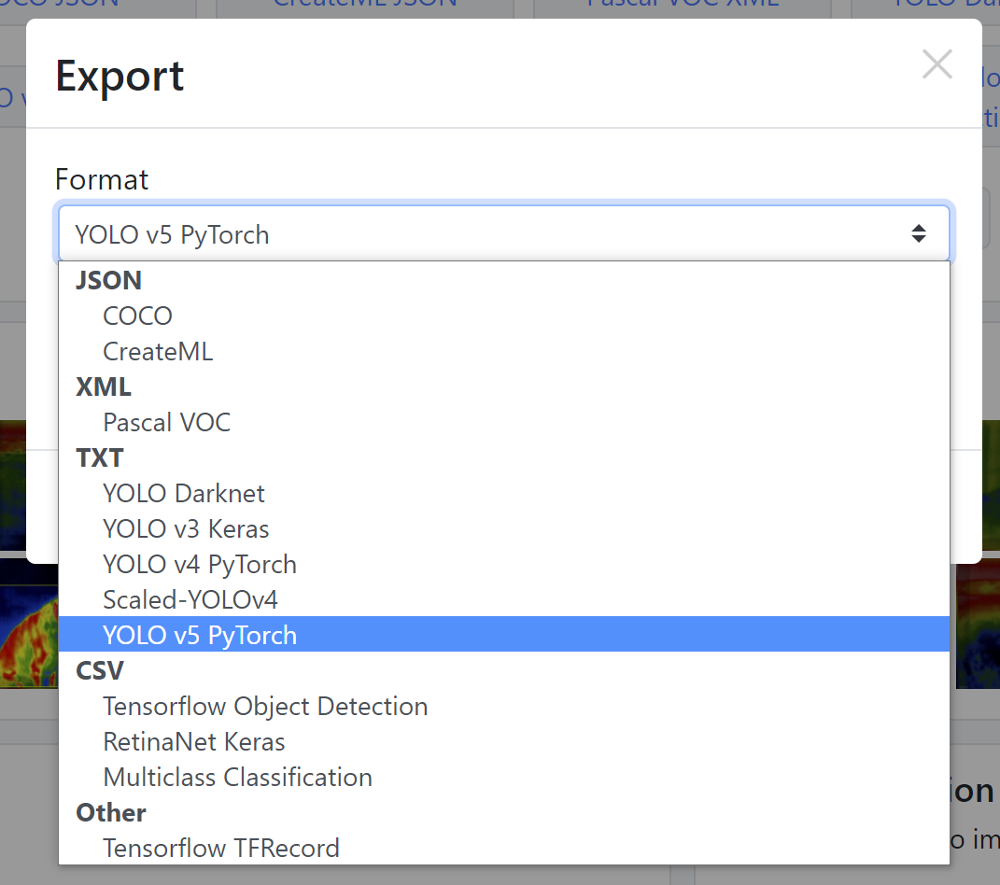



**Quick Note Labeling Tools**
 we used [Roboflow Annotate](https://docs.roboflow.com/annotate) to annotate our dataset



In [2]:
#downloads the dataset, censored as it contains a private key but when running it it contains link to download our dataset
%cd /content
!curl -L "https://app.roboflow.com/ds/oh8RKKCfCq?key=rKGMbpBjUf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   910  100   910    0     0   3499      0 --:--:-- --:--:-- --:--:--  3513
100 39.8M  100 39.8M    0     0  44.1M      0 --:--:-- --:--:-- --:--:--  106M
Archive:  roboflow.zip
  inflating: README.dataset.txt      
  inflating: README.roboflow.txt     
  inflating: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/11_jpg.rf.b348f0526165124de5ce9233a4b508db.jpg  
 extracting: test/images/15_jpg.rf.9f1180df9468b53f878461b49dac233d.jpg  
 extracting: test/images/19_jpg.rf.c382eaa471d76385daadd1b86ed795a1.jpg  
 extracting: test/images/1_jpg.rf.fb1d26787e7c6838c6236718a2f6f83e.jpg  
 extracting: test/images/20_jpg.rf.bff707cfb97944fe393a76f9ad1f4263.jpg  
 extracting: test/images/22_jpg.rf.16a102dc0aaa9db157a963a20b18fd90.jpg  
 extracting: test/images/22_jpg.rf.d184af4ef3af0fc

The export creates a YOLOv5 .yaml file called `data.yaml` specifying the location of a YOLOv5 `images` folder, a YOLOv5 `labels` folder, and information on our custom classes.

In [3]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 9
names: ['Apple_Overripe', 'Apple_Ripe', 'Apple_Unripe', 'Mango_Overripe', 'Mango_Ripe', 'Mango_Unripe', 'Pineapple_Overripe', 'Pineapple_Ripe', 'Pineapple_Unripe']

roboflow:
  workspace: fypproject-f7dxj
  project: fruitexpirydetector
  version: 2
  license: CC BY 4.0
  url: https://universe.roboflow.com/fypproject-f7dxj/fruitexpirydetector/dataset/2

# Define Model Configuration and Architecture

Next we write a model configuration file for our custom object detector. For this activity, we chose the smallest, fastest base model of YOLOv5. You have the option to pick from other YOLOv5 models including:

* YOLOv5s
* YOLOv5m
* YOLOv5l
* YOLOv5x

You can also edit the structure of the network in this step, though rarely will you need to do this. Here is the YOLOv5 model configuration file, which we term `custom_yolov5s.yaml`:




```
nc: 3
depth_multiple: 0.33
width_multiple: 0.50

anchors:
  - [10,13, 16,30, 33,23]
  - [30,61, 62,45, 59,119]
  - [116,90, 156,198, 373,326]

backbone:
  [[-1, 1, Focus, [64, 3]],
   [-1, 1, Conv, [128, 3, 2]],
   [-1, 3, Bottleneck, [128]],
   [-1, 1, Conv, [256, 3, 2]],
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 6, BottleneckCSP, [1024]],
  ]

head:
  [[-1, 3, BottleneckCSP, [1024, False]],
   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],
   [-2, 1, nn.Upsample, [None, 2, "nearest"]],
   [[-1, 6], 1, Concat, [1]],
   [-1, 1, Conv, [512, 1, 1]],
   [-1, 3, BottleneckCSP, [512, False]],
   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],
   [-2, 1, nn.Upsample, [None, 2, "nearest"]],
   [[-1, 4], 1, Concat, [1]],
   [-1, 1, Conv, [256, 1, 1]],
   [-1, 3, BottleneckCSP, [256, False]],
   [-1, 1, nn.Conv2d, [na * (nc + 5), 1, 1, 0]],

   [[], 1, Detect, [nc, anchors]],
  ]
```



We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [4]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [5]:
#this is the model configuration we will use
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 

In [6]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))


In [7]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!

With our `data.yaml` and `custom_yolov5s.yaml` files ready to go we are ready to train!

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [8]:
# train yolov5s on custom data
# time its performance
%%time
%cd /content/yolov5/
!python train.py --batch 16 --epochs 300 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
2024-05-28 23:11:27.177548: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-28 23:11:27.177610: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-28 23:11:27.179020: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=, cfg=./models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi

Results of training are saved to runs/train/yolov5s_results. Important metrics are mAP50 and mAP50-95.


# Evaluate Custom YOLOv5 Detector Performance

Now that we have completed training, we can evaluate how well the training procedure performed by looking at the validation metrics. The training script will drop tensorboard logs in runs. We visualize those here:

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [9]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

In [10]:
!pwd

/content/yolov5


GROUND TRUTH TRAINING DATA:


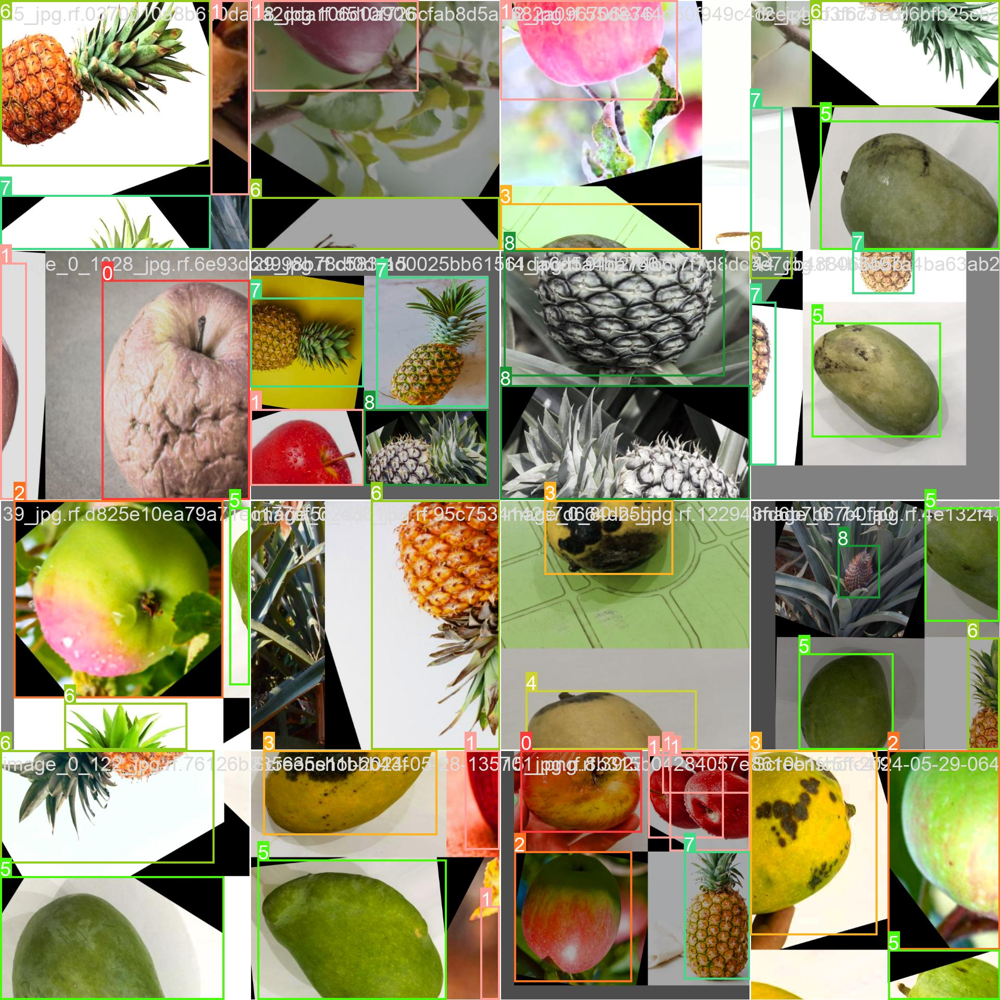

In [11]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='runs/train/yolov5s_results/train_batch0.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


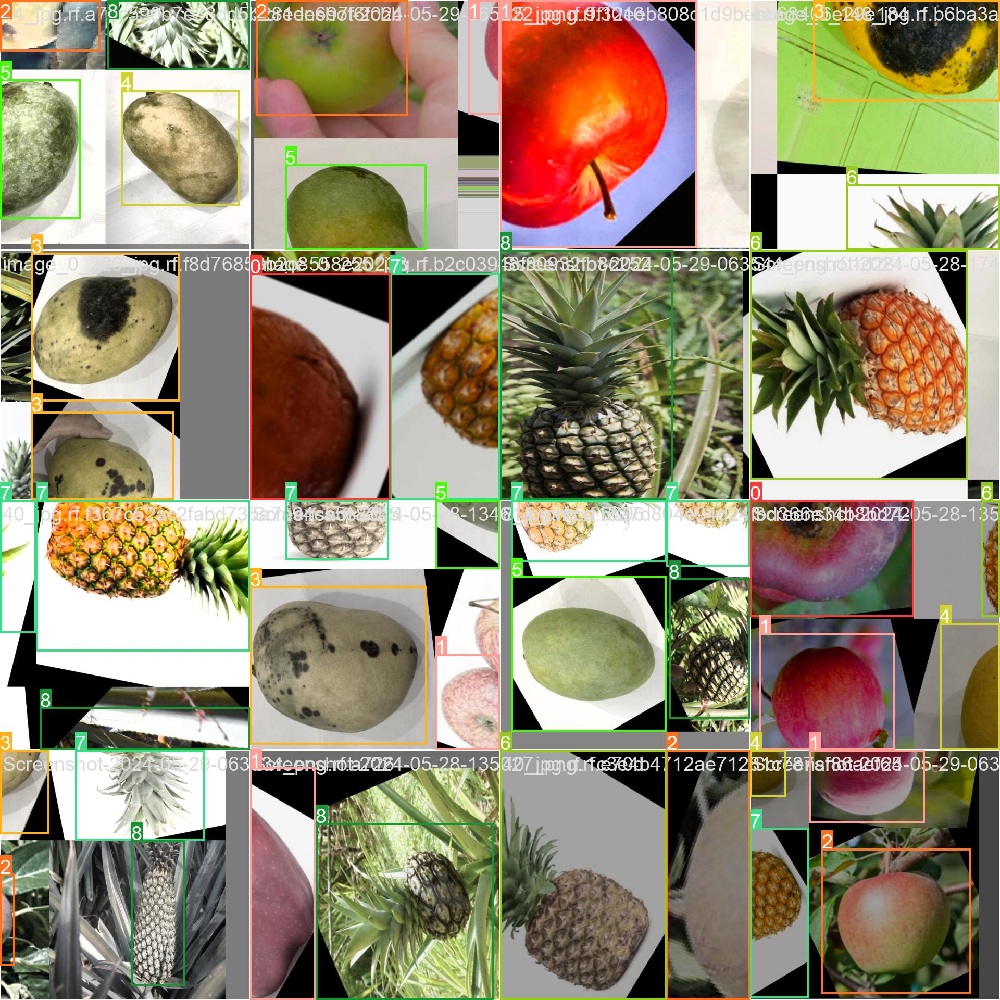

In [12]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='runs/train/yolov5s_results/train_batch1.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

Now we take our trained model and make inference on test images. After training has completed model weights will save in `weights/`. For inference we invoke those weights along with a `conf` specifying model confidence (higher confidence required makes less predictions), and a inference `source`. `source` can accept a directory of images, individual images, video files, and also a device's webcam port. For source, I have moved our test/*jpg to `test/images/`.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights  runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

Finally, we visualize our inference on ALL test images.  This will look much better with longer training above

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere. choose your own directory

In [13]:
from google.colab import drive
drive.mount('/content/drive')

DataFolder = "/content/drive/MyDrive/SDAAI/Data"
FruitFolder = DataFolder + "/FruitFolder"

Mounted at /content/drive


In [14]:
import os
Fruit_model = FruitFolder+ "/model"
if not os.path.exists(Fruit_model):
  os.makedirs(Fruit_model)

%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt $Fruit_model

Copy output images for reference

In [15]:
Fruit_output = FruitFolder+ "/output"
if not os.path.exists(Fruit_output):
  os.makedirs(Fruit_output)

%cp /content/yolov5/runs/detect/exp/*.* $Fruit_output

cp: cannot stat '/content/yolov5/runs/detect/exp/*.*': No such file or directory


In [ ]:
%ls $FruitFolder -lR

/content/drive/MyDrive/SDAAI/data/LU04_Thermal:
total 8
drwx------ 2 root root 4096 May 25 10:46 model/
drwx------ 2 root root 4096 May 25 09:38 output/

/content/drive/MyDrive/SDAAI/data/LU04_Thermal/model:
total 14601
-rw------- 1 root root 14951300 May 25 10:46 best.pt

/content/drive/MyDrive/SDAAI/data/LU04_Thermal/output:
total 907
-rw------- 1 root root 39046 May  8 11:59 'IMG_0002 4_jpg.rf.6d1c60bf9f8779f13291c0547ea1ff70.jpg'
-rw------- 1 root root 52479 May  8 11:59 'IMG_0006 5_jpg.rf.cd46e6a862d6ffb7fce6795067ce7cc7.jpg'
-rw------- 1 root root 36919 May  8 11:59  IMG_0009_jpg.rf.ecdb212f7d7796e682a87e2e1d6e907e.jpg
-rw------- 1 root root 44048 May  8 11:59 'IMG_0012 2_jpg.rf.4c8e033ea0189ebd28c4e3751edd7a6a.jpg'
-rw------- 1 root root 45308 May  8 11:59  IMG_0022_jpg.rf.c89662890a0f5d8a915677ed21165d2b.jpg
-rw------- 1 root root 45128 May  8 11:59 'IMG_0023 3_jpg.rf.ac45d9a3e591d1377f50b25c2415a5b7.jpg'
-rw------- 1 root root 39350 May  8 11:59 'IMG_0024 2_jpg.rf.7f92f2bd2971

## Congrats!

Hope you enjoyed this!
